# Image Enhancement using Real-ESRGAN

## Introduction

This Jupyter Notebook is dedicated to the demonstration and explanation of using the Real-ESRGAN model for enhancing image quality. Real-ESRGAN is an improved version of ESRGAN (Enhanced Super-Resolution Generative Adversarial Networks) that is designed for real-world applications by offering robust and high-quality super-resolution on diverse images.


### Import Libraries

In [14]:
import os

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision import models, transforms
import matplotlib.pyplot as plt
from tqdm import tqdm

### Setup Model and Device Configuration


In [15]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
gen_weights_filename = "ilia_real_esrgan.pth"
disc_weights_filename = "ilia_real_esrgan_disc.pth"

Using device: cuda


### Flickr2K Dataset Class for Image Super-Resolution

Due to memory limitation on my machine, the source resolution is limited to 64x64. The model will increase the resolution by 4 times to 256x256.

Flickr2K: https://cv.snu.ac.kr/research/EDSR/Flickr2K.tar

In [16]:
class Flickr2KDataset(Dataset):
    def __init__(self, hr_dir, lr_dirs):
        self.hr_dir = hr_dir
        self.lr_dirs = lr_dirs 
        self.lr_images = []
        self.hr_images = os.listdir(hr_dir)

        self.lr_transform = transforms.Compose([
            transforms.Resize((64,64)),
            transforms.ToTensor(),
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
        ])
        
        self.hr_transform = transforms.Compose([
            transforms.Resize((256,256)),
            transforms.ToTensor(),
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
        ])

        self.hr_images.sort()

        for lr_dir in lr_dirs:
            for img_name in os.listdir(lr_dir):
                lr_img_path = os.path.join(lr_dir, img_name)
                base_name = img_name.split('x')[0] + '.png'
                hr_img_path = os.path.join(hr_dir, base_name)
                if os.path.exists(hr_img_path):
                    self.lr_images.append((lr_img_path, hr_img_path))

        self.lr_images.sort(key=lambda x: x[1])

    def __len__(self):
        return len(self.lr_images)

    def __getitem__(self, idx):
        lr_img_path, hr_img_path = self.lr_images[idx]

        lr_img = Image.open(lr_img_path).convert('RGB')
        hr_img = Image.open(hr_img_path).convert('RGB')

        if self.lr_transform:
            lr_img = self.lr_transform(lr_img)
        if self.hr_transform:
            hr_img = self.hr_transform(hr_img)

        return lr_img, hr_img

### Data Loading for Super-Resolution Training

In [17]:
hr_dir = 'dataset/Flickr2K/Flickr2K_HR'
lr_dirs = [
    'dataset/Flickr2K/Flickr2K_LR_bicubic/X2',
    'dataset/Flickr2K/Flickr2K_LR_bicubic/X3',
    'dataset/Flickr2K/Flickr2K_LR_bicubic/X4',
    'dataset/Flickr2K/Flickr2K_LR_unknown/X2',
    'dataset/Flickr2K/Flickr2K_LR_unknown/X3',
    'dataset/Flickr2K/Flickr2K_LR_unknown/X4'
]

batch_size = 8

train_dataset = Flickr2KDataset(hr_dir, lr_dirs)
train_size = int(1.0 * len(train_dataset))
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

### Visualization of Dataset Samples

Batch 1:


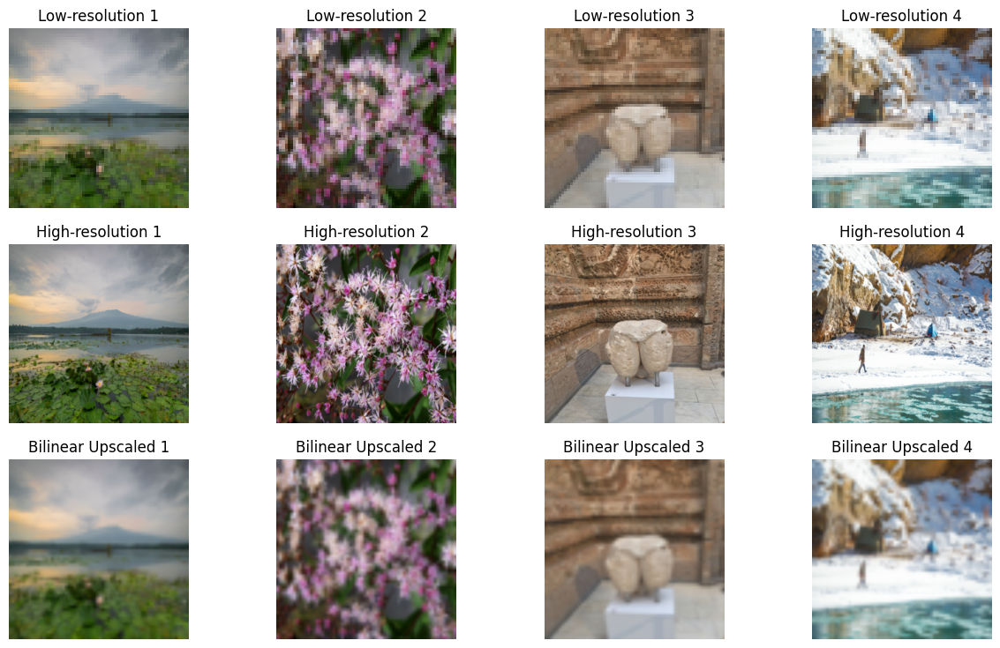

In [18]:
def show_images(lr_imgs, hr_imgs, sr_images, num_images=4):
    rows = 0
    images_list = []
    titles_list = []

    if lr_imgs is not None:
        rows += 1
        images_list.append(lr_imgs)
        titles_list.append("Low-resolution")
    if hr_imgs is not None:
        rows += 1
        images_list.append(hr_imgs)
        titles_list.append("High-resolution")
    if lr_imgs is not None:
        upscaled_lr_imgs = F.interpolate(lr_imgs, size=(256, 256), mode='bilinear', align_corners=False)
        rows += 1
        images_list.append(upscaled_lr_imgs)
        titles_list.append("Bilinear Upscaled")
    if sr_images is not None:
        rows += 1
        images_list.append(sr_images)
        titles_list.append("Super-Resolved")

    fig, axes = plt.subplots(rows, num_images, figsize=(15, rows * 3))
    if rows == 1:
        axes = [axes]

    for idx, imgs in enumerate(images_list):
        for i in range(num_images):
            if i < len(imgs):
                img = imgs[i].permute(1, 2, 0).cpu().numpy() 
                img = img * 0.5 + 0.5 
                axes[idx][i].imshow(img)
                axes[idx][i].set_title(f"{titles_list[idx]} {i+1}")
                axes[idx][i].axis('off')

    plt.show()

num_batches_to_check = 1
for i, (lr_imgs, hr_imgs) in enumerate(train_loader):
    print(f"Batch {i+1}:")
    show_images(lr_imgs, hr_imgs, None, num_images=4) 
    
    if i >= num_batches_to_check - 1:
        break

**Residual Dense Block (RDB)** is a key architectural unit in image processing models like Real-ESRGAN. 
It processes images through a series of steps to extract and refine features.

### Key Components of RDB

- **Multiple Convolutional Layers**: The RDB utilizes several convolutional layers where each layer aims to extract and enhance different aspects of the image features. The layers are densely connected, meaning each layer receives inputs from all preceding layers in addition to the original input. This setup allows for a rich feature set that captures comprehensive information about the image at various levels of abstraction.

- **LeakyReLU Activation**: Each convolutional layer in the RDB is followed by a LeakyReLU activation function, which helps to introduce non-linearity in the processing while allowing a small gradient when the unit is not active. This is useful for maintaining the flow of gradients during training, which can prevent vanishing gradients in deep networks.

- **Residual Connection**: A key feature of the RDB that scales the output of the dense block and adds it back to the block's input. This technique, controlled by a scaling factor `beta`, aids in training deeper networks by mitigating the risk of training instability and degradation.



In [19]:
class ResidualDenseBlock(nn.Module):
    def __init__(self,in_channel = 64,inc_channel = 32, beta = 0.2):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channel, inc_channel, 3, 1, 1)
        self.conv2 = nn.Conv2d(in_channel + inc_channel, inc_channel, 3, 1, 1)
        self.conv3 = nn.Conv2d(in_channel + 2 * inc_channel, inc_channel, 3, 1, 1)
        self.conv4 = nn.Conv2d(in_channel + 3 * inc_channel, inc_channel, 3, 1, 1)
        self.conv5 = nn.Conv2d(in_channel + 4 * inc_channel,  in_channel, 3, 1, 1)
        self.lrelu = nn.LeakyReLU()
        self.b = beta
        
    def forward(self, x):
        block1 = self.lrelu(self.conv1(x))
        block2 = self.lrelu(self.conv2(torch.cat((block1, x), dim = 1)))
        block3 = self.lrelu(self.conv3(torch.cat((block2, block1, x), dim = 1)))
        block4 = self.lrelu(self.conv4(torch.cat((block3, block2, block1, x), dim = 1)))
        out = self.conv5(torch.cat((block4, block3, block2, block1, x), dim = 1))
        
        return x + self.b * out

## Residual In Residual Dense Block (RRDB)

The `ResidualInResidualDenseBlock` (RRDB) is an advanced architectural component used in high-fidelity image super-resolution models like Real-ESRGAN. It intensifies the feature refinement process by incorporating three sequential `ResidualDenseBlock` (RDB) units within a single block, each building upon the output of the previous to progressively enhance image details.

In [20]:
class ResidualInResidualDenseBlock(nn.Module):
    def __init__(self, in_channel = 64, out_channel = 32, beta = 0.2):
        super().__init__()
        self.RDB = ResidualDenseBlock(in_channel, out_channel)
        self.b = beta
    
    def forward(self, x):
        out = self.RDB(x)
        out = self.RDB(out)
        out = self.RDB(out)
        
        return x + self.b * out

### Real-ESRGAN Generator

The `Generator` class is upscale low-resolution images to high-resolution output. 

#### Key components:

1. **Initial Convolution**: The process begins with a standard convolutional layer that increases the depth of the input image from 3 channels to 64. This step prepares the image for deeper processing.

2. **RRDB Blocks**: The core of the generator is a series of Residual In Residual Dense Blocks (RRDBs). These blocks are stacked sequentially to deeply process the features extracted from the initial convolution.

3. **Feature Consolidation**: After passing through the RRDBs, another convolutional layer is applied to consolidate and normalize the features prepared by the dense blocks.

4. **Upscaling**: The network then uses upscaling blocks, each followed by an upsampling operation that doubles the size of the feature maps. 

5. **Output Convolution**: Finally, the output convolution transforms the upscaled features back to the original three channels, producing the final high-resolution image.

In [21]:
class Generator(nn.Module):
    def __init__(self,in_channel = 3, out_channel = 3, noRRDBBlock = 23):
        super().__init__()   
        self.conv1 = nn.Conv2d(3, 64, 3, 1, 1)

        RRDB = ResidualInResidualDenseBlock()
        RRDB_layer = []
        for i in range(noRRDBBlock):
            RRDB_layer.append(RRDB)
        self.RRDB_block =  nn.Sequential(*RRDB_layer)

        self.RRDB_conv2 = nn.Conv2d(64, 64, 3, 1, 1)
        self.upconv = nn.Conv2d(64, 64, 3, 1, 1)

        self.out_conv = nn.Conv2d(64, 3, 3, 1, 1)
    
    def forward(self, x):
        first_conv = self.conv1(x)
        RRDB_full_block = torch.add(self.RRDB_conv2(self.RRDB_block(first_conv)),first_conv)
        upconv_block1 = self.upconv(F.interpolate(RRDB_full_block, scale_factor = 2))
        upconv_block2 = self.upconv(F.interpolate(upconv_block1, scale_factor = 2))
        out = self.out_conv(upconv_block2)
        
        return out

## Discriminator

The `Discriminator` class helps in GAN training by assessing whether the images generated by the Generator are indistinguishable from real images. Its primary function is to classify images as 'real' or 'fake'.


In [22]:
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3,64,3,padding=1,bias=False)
        self.conv2 = nn.Conv2d(64,64,3,stride=2,padding=1,bias=False)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64,128,3,padding=1,bias=False)
        self.bn3 = nn.BatchNorm2d(128)
        self.conv4 = nn.Conv2d(128,128,3,stride=2,padding=1,bias=False)
        self.bn4 = nn.BatchNorm2d(128)
        self.conv5 = nn.Conv2d(128,256,3,padding=1,bias=False)
        self.bn5 = nn.BatchNorm2d(256)
        self.conv6 = nn.Conv2d(256,256,3,stride=2,padding=1,bias=False)
        self.bn6 = nn.BatchNorm2d(256)
        self.conv7 = nn.Conv2d(256,512,3,padding=1,bias=False)
        self.bn7 = nn.BatchNorm2d(512)
        self.conv8 = nn.Conv2d(512,512,3,stride=2,padding=1,bias=False)
        self.bn8 = nn.BatchNorm2d(512)
        self.fc1 = nn.Linear(512*16*16,1024)
        self.fc2 = nn.Linear(1024,1)
        self.drop = nn.Dropout2d(0.3)
        
    def forward(self,x):
        block1 = F.leaky_relu(self.conv1(x))
        block2 = F.leaky_relu(self.bn2(self.conv2(block1)))
        block3 = F.leaky_relu(self.bn3(self.conv3(block2)))
        block4 = F.leaky_relu(self.bn4(self.conv4(block3)))
        block5 = F.leaky_relu(self.bn5(self.conv5(block4)))
        block6 = F.leaky_relu(self.bn6(self.conv6(block5)))
        block7 = F.leaky_relu(self.bn7(self.conv7(block6)))
        block8 = F.leaky_relu(self.bn8(self.conv8(block7)))
        block8 = block8.view(-1,block8.size(1)*block8.size(2)*block8.size(3))
        block9 = F.leaky_relu(self.fc1(block8))
        block10 = torch.sigmoid(self.drop(self.fc2(block9)))
        return block9

## Loss Calculation

1. **Discriminator Loss (`d_loss`)**: The discriminator's loss is calculated using the concept of relativistic average Discriminator loss. It evaluates how well the discriminator can distinguish between real and generated images relative to an average. The loss is computed as:
   
   $$
   d\_loss = \frac{1}{2} \left( \text{disc\_loss}(\text{real\_label} - \text{mean}(\text{fake\_label}), \text{ones}) + \text{disc\_loss}(\text{fake\_label} - \text{mean}(\text{real\_label}), \text{zeros}) \right)
   $$

   where:
   - `real_label` is the discriminator's output for real images.
   - `fake_label` is the discriminator's output for generated images.
   - `ones` and `zeros` are tensors of 1s and 0s respectively, representing the true labels for real and fake images.

2. **Generator Loss (`g_loss`)**: The generator's loss is similarly calculated using relativistic loss but with the targets swapped. The goal here is for the generator to fool the discriminator into believing that the generated images are real:

   $$
   g\_loss = \frac{1}{2} \left( \text{gen\_loss}(\text{fake\_label} - \text{mean}(\text{real\_label}), \text{ones}) + \text{gen\_loss}(\text{real\_label} - \text{mean}(\text{fake\_label}), \text{zeros}) \right)
   $$

3. **VGG and MSE Loss**: Additional losses are used to measure the perceptual similarity and pixel-wise accuracy between the generated images and the real images, respectively:
   
   $$
   v\_loss = \text{vgg\_loss}(\text{VGG}(generated\_output), \text{VGG}(real\_data))
   $$
   $$
   m\_loss = \text{mse\_loss}(generated\_output, real\_data)
   $$

4. **Total Generator Loss**: The final generator loss combines the generator's adversarial loss with the VGG and MSE losses:

   $$
   generator\_loss = \lambda \cdot g\_loss + v\_loss + \eta \cdot m\_loss
   $$

   where `lambda` and `eta` are weighting factors that balance the contribution of each component to the total loss.


These loss functions guide both the discriminator and generator towards more accurate and realistic image generation and classification. 


In [23]:
class Losses():
    def __init__(self, disc_optimizer, gen_optimizer, vgg):
        super().__init__()
        self.disc_optimizer = disc_optimizer
        self.gen_optimizer = gen_optimizer
        self.vgg = vgg
        self.disc_losss = nn.BCEWithLogitsLoss()
        self.gen_losss = nn.BCEWithLogitsLoss()
        self.vgg_loss = nn.MSELoss()
        self.mse_loss = nn.MSELoss()
        self.lamda = 0.005
        self.eeta = 0.02 
        
    def calculateLoss(self, discriminator, generator, LR_image, HR_image):

        self.disc_optimizer.zero_grad()
        generated_output = generator(LR_image.to(device).float())
        fake_data = generated_output.clone()
        fake_label = discriminator(fake_data)

        
        HR_image_tensor = HR_image.to(device).float()
        real_data = HR_image_tensor.clone()
        real_label = discriminator(real_data)
        
        relativistic_d1_loss = self.disc_losss((real_label - torch.mean(fake_label)), torch.ones_like(real_label, dtype = torch.float))
        relativistic_d2_loss = self.disc_losss((fake_label - torch.mean(real_label)), torch.zeros_like(fake_label, dtype = torch.float))      

        d_loss = (relativistic_d1_loss + relativistic_d2_loss) / 2
        d_loss.backward(retain_graph = True)
        self.disc_optimizer.step()

        fake_label_ = discriminator(generated_output)
        real_label_ = discriminator(real_data)
        self.gen_optimizer.zero_grad()

        g_real_loss = self.gen_losss((fake_label_ - torch.mean(real_label_)), torch.ones_like(fake_label_, dtype = torch.float))
        g_fake_loss = self.gen_losss((real_label_ - torch.mean(fake_label_)), torch.zeros_like(fake_label_, dtype = torch.float))
        g_loss = (g_real_loss + g_fake_loss) / 2
        
        v_loss = self.vgg_loss(self.vgg.features[:6](generated_output),self.vgg.features[:6](real_data))
        m_loss = self.mse_loss(generated_output,real_data)
        generator_loss = self.lamda * g_loss + v_loss + self.eeta * m_loss
        generator_loss.backward()
        self.gen_optimizer.step()

        return d_loss,generator_loss

#### Initializing the Generator and Discriminator

In [24]:
gen = Generator().to(device)
disc = Discriminator().to(device)

gen.load_state_dict(torch.load(gen_weights_filename))
disc.load_state_dict(torch.load(disc_weights_filename))

gen_optimizer = optim.Adam(gen.parameters(), lr=0.0002)
disc_optimizer = optim.Adam(disc.parameters(), lr=0.0002)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


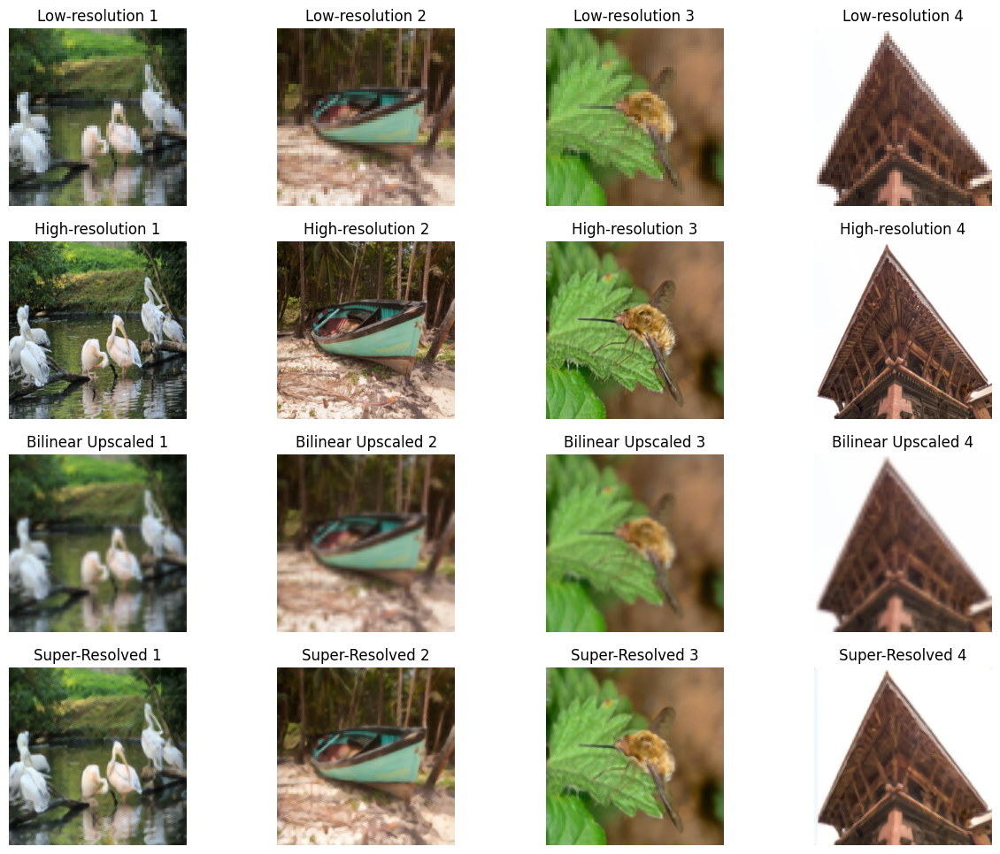

In [25]:
fixed_lr_imgs, fixed_hr_imgs = next(iter(train_loader))
fixed_lr_imgs, fixed_hr_imgs = fixed_lr_imgs.to(device), fixed_hr_imgs.to(device)


with torch.no_grad():
        div2k_sr_imgs = gen(fixed_lr_imgs)
        show_images(fixed_lr_imgs, fixed_hr_imgs, div2k_sr_imgs, num_images=4)

### Training 

Epoch: 1  d_loss: 0.40093673514312833  g_loss: 2.5603933751703027: 100%|██████████| 1988/1988 [41:17<00:00,  1.25s/it]  
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


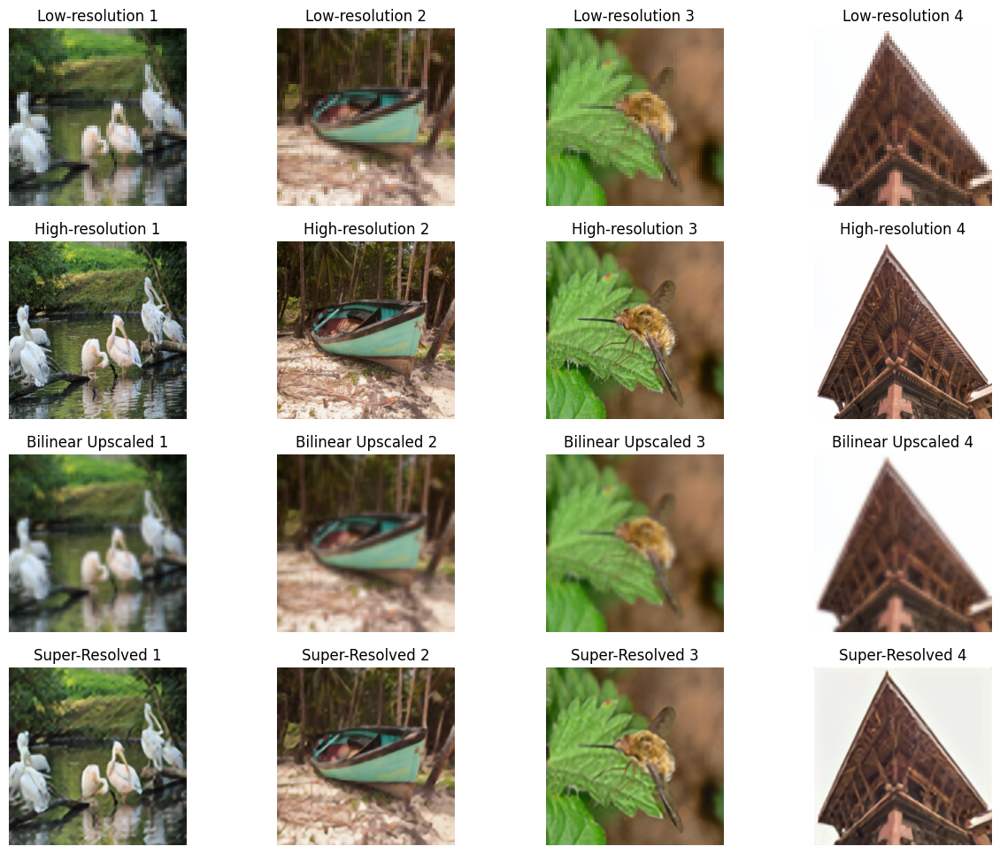

Saved Improved Model
Epoch 1/100 completed. Best Val Loss: 2.5604


Epoch: 2  d_loss: 0.0013474344743182873  g_loss: 2.2857667621772295: 100%|██████████| 1988/1988 [40:55<00:00,  1.24s/it]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


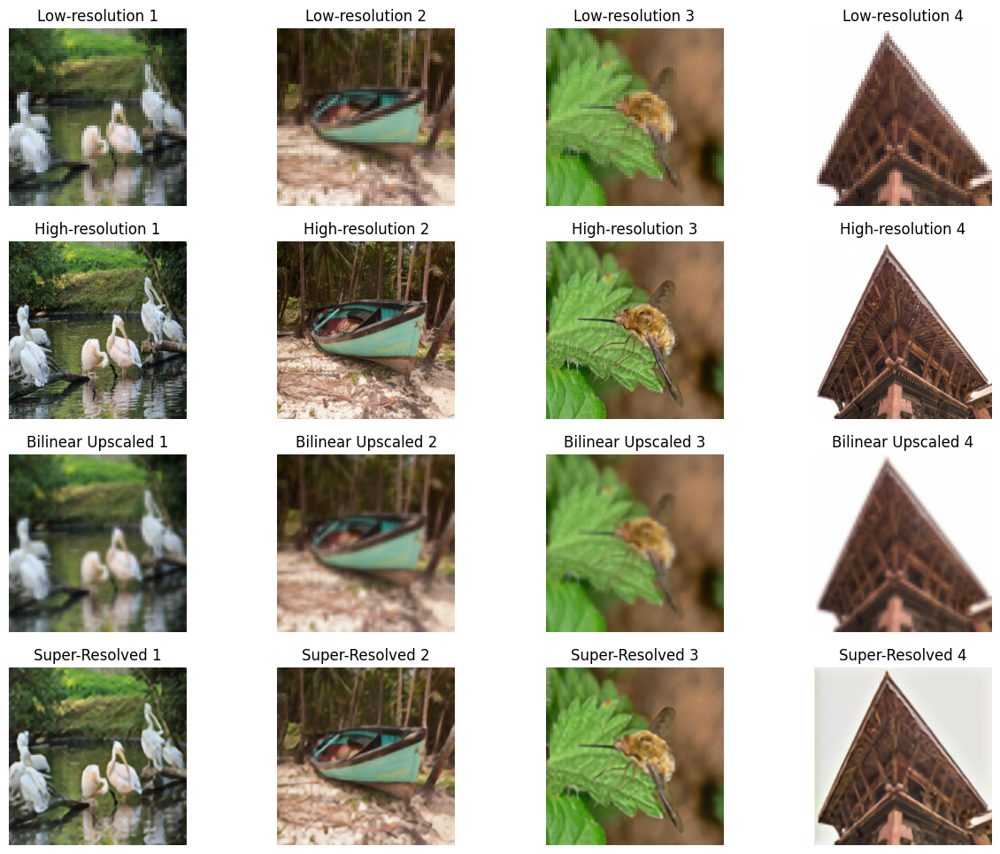

Saved Improved Model
Epoch 2/100 completed. Best Val Loss: 2.2858


Epoch: 3  d_loss: 0.0001643597416121961  g_loss: 2.3988816194850915: 100%|██████████| 1988/1988 [41:25<00:00,  1.25s/it] 
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


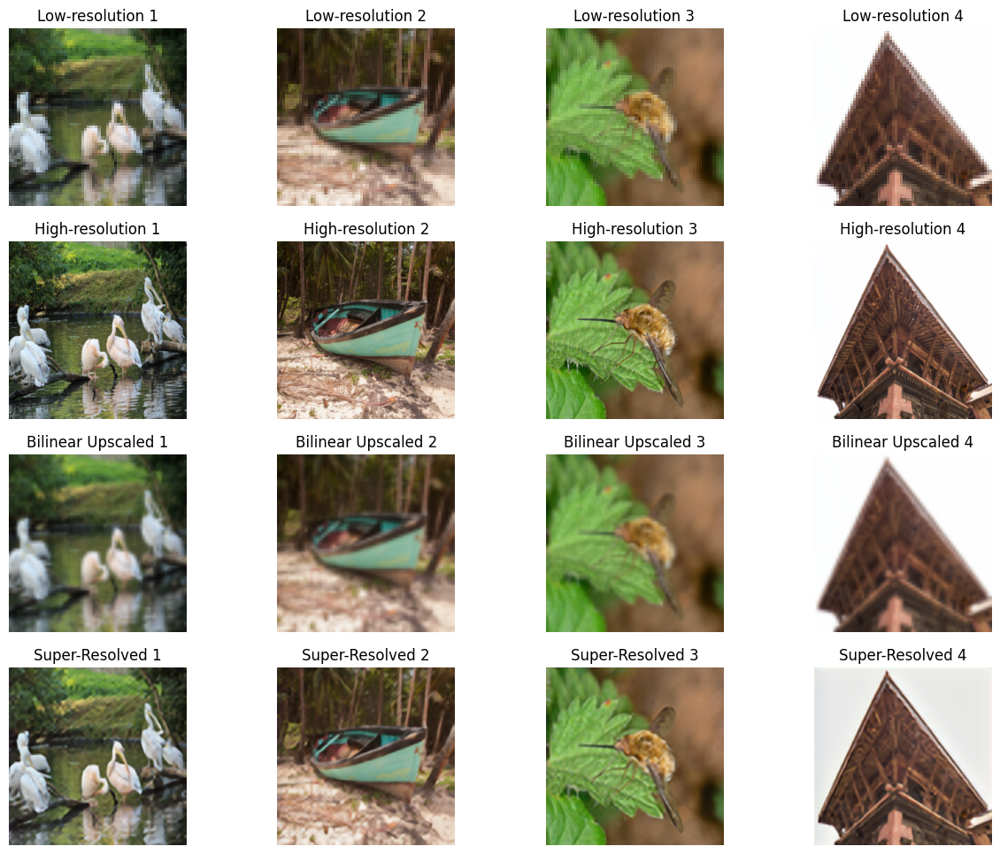

Epoch 3/100 completed. Best Val Loss: 2.2858


Epoch: 4  d_loss: 0.00046326523092438923  g_loss: 2.473932864500483: 100%|██████████| 1988/1988 [39:52<00:00,  1.20s/it] 
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


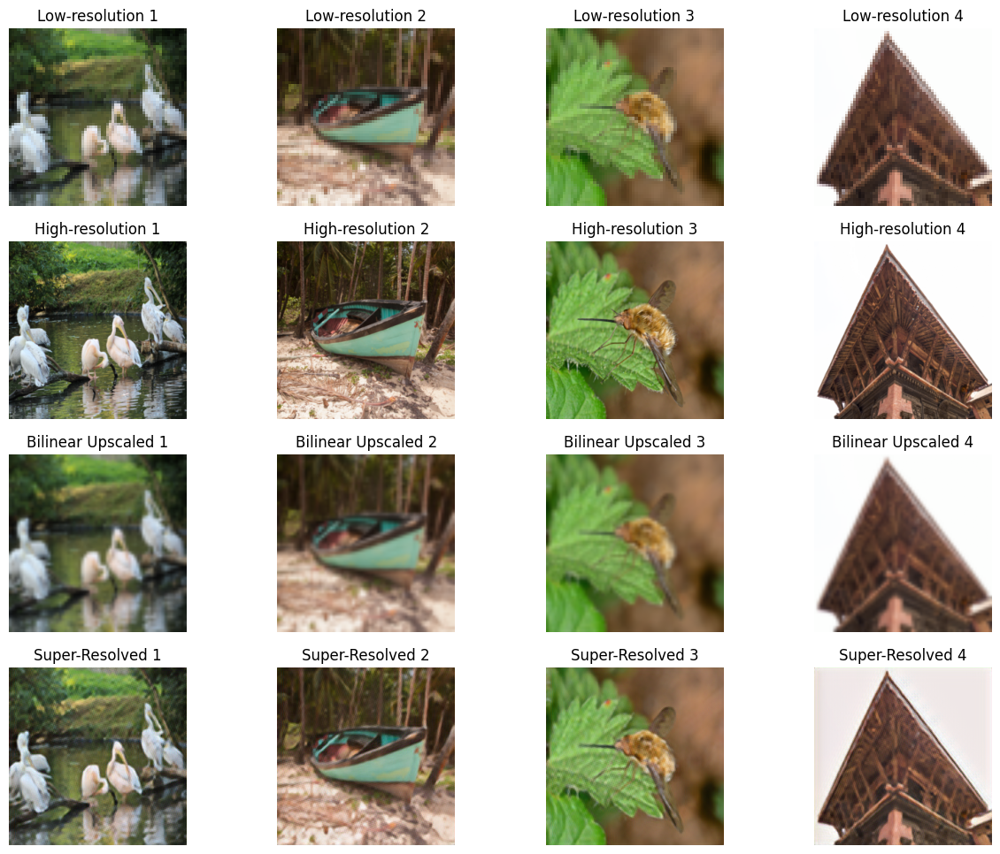

Early stopping triggered


In [26]:
patience = 3
best_val_loss = float('inf')
counter = 0

vgg = models.vgg19(pretrained=True).to(device)

epochs = 100
for epoch in range(epochs):
    gen.train()
    disc.train()

    train_loss = 0  
    dloss_list=[]
    gloss_list=[]

    progress_bar = tqdm(train_loader, desc=f"Epoch {epoch + 1}/{epochs}")
    for lr_imgs, hr_imgs in progress_bar:
        looses = Losses(disc_optimizer, gen_optimizer, vgg) 
        disc_loss, gen_loss = looses.calculateLoss(disc, gen, lr_imgs, hr_imgs)
        dloss_list.append(disc_loss.item())
        gloss_list.append(gen_loss.item())
        torch.cuda.empty_cache()

        progress_bar.set_description(
            "Epoch: " + str(epoch + 1)+"  d_loss: " + str(np.mean(dloss_list)) + "  g_loss: "  +str(np.mean(gloss_list))
        )

    gen.eval()
    with torch.no_grad():
        fixed_sr_imgs = gen(fixed_lr_imgs)
        show_images(fixed_lr_imgs, fixed_hr_imgs, fixed_sr_imgs, num_images=4)
      
    loss = np.mean(gloss_list)

    if loss < best_val_loss:
        best_val_loss = loss
        counter = 0
        torch.save(gen.state_dict(), gen_weights_filename)
        torch.save(disc.state_dict(), disc_weights_filename)
        print("Saved Improved Model")
    else:
        counter += 1
        if counter >= patience:
            print("Early stopping triggered")
            break

    print(f"Epoch {epoch+1}/{epochs} completed. Best Val Loss: {best_val_loss:.4f}")


### DIV2K dataset for additional training

DIV2K: https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_HR.zip

In [27]:
class DIV2KDataset(Dataset):
    def __init__(self, hr_dir, lr_dir):
        self.hr_dir = hr_dir
        self.lr_dir = lr_dir
        self.hr_images = os.listdir(hr_dir)
        self.lr_images = os.listdir(lr_dir)

        self.transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
        ])

        self.hr_images.sort()
        self.lr_images.sort()

    def __len__(self):
        return len(self.hr_images)

    def __getitem__(self, idx):
        hr_img_path = os.path.join(self.hr_dir, self.hr_images[idx])
        lr_img_path = os.path.join(self.lr_dir, self.lr_images[idx])

        hr_img = Image.open(hr_img_path).convert('RGB')
        lr_img = Image.open(lr_img_path).convert('RGB')

        if self.transform:
            hr_img = self.transform(hr_img)
            lr_img = self.transform(lr_img)

        return lr_img, hr_img


In [28]:
# def precompute_low_res_images(hr_dir, lr_dir):
#     if not os.path.exists(lr_dir):
#         os.makedirs(lr_dir)

#     hr_images = os.listdir(hr_dir)
#     for img_name in tqdm(hr_images):
#         hr_img_path = os.path.join(hr_dir, img_name)
#         hr_img = Image.open(hr_img_path).convert('RGB')
#         lr_img = hr_img.resize((64, 64), Image.BICUBIC)
#         # lr_img = hr_img.resize((256, 256), Image.BICUBIC)
#         lr_img.save(os.path.join(lr_dir, img_name))

# hr_dir = 'dataset/DIV2K_train_HR'
# lr_dir = 'dataset/DIV2K_train_LR'

# precompute_low_res_images(hr_dir, lr_dir)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


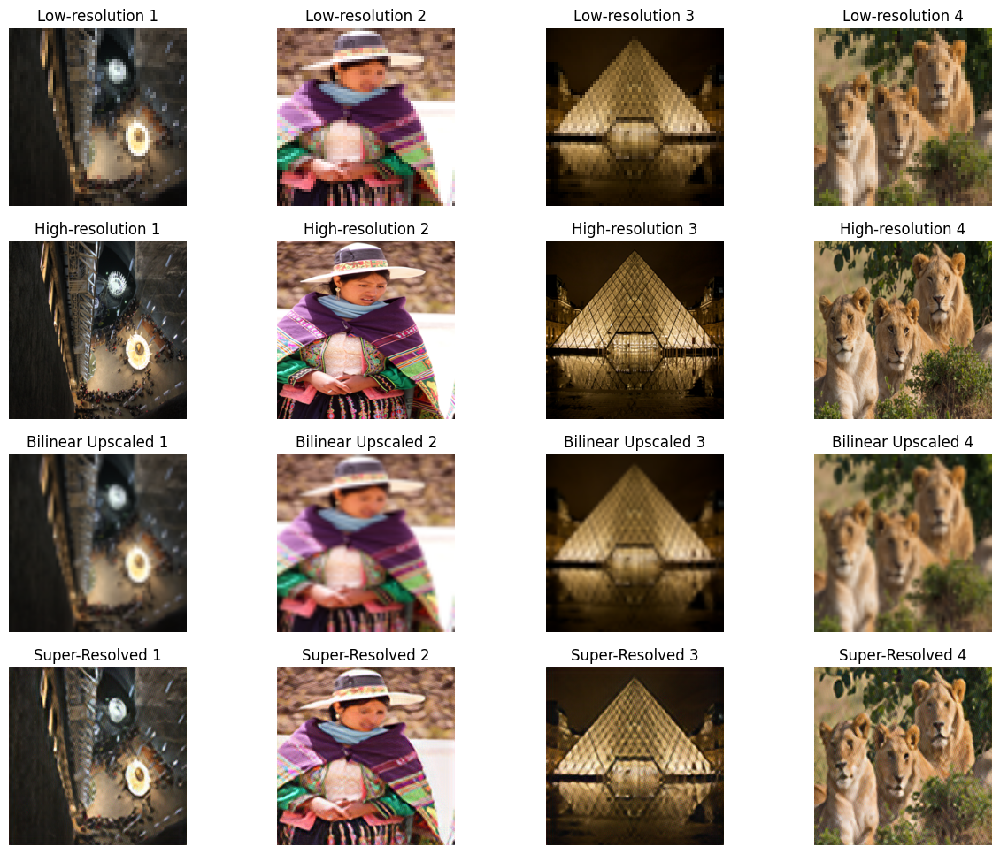

In [29]:
div2k_hr_dir = 'dataset/DIV2K_train_HR/cache_hr'
div2k_lr_dir = 'dataset/DIV2K_train_HR/cache_lr'

div2k_dataset = DIV2KDataset(div2k_hr_dir, div2k_lr_dir)
div2k_data_loader = DataLoader(div2k_dataset, batch_size=batch_size, shuffle=True)

div2k_data_loader_lr_imgs, div2k_data_loader_hr_imgs = next(iter(div2k_data_loader))
div2k_data_loader_lr_imgs, div2k_data_loader_hr_imgs = div2k_data_loader_lr_imgs.to(device), div2k_data_loader_hr_imgs.to(device)

with torch.no_grad():
        div2k_sr_imgs = gen(div2k_data_loader_lr_imgs)
        show_images(div2k_data_loader_lr_imgs, div2k_data_loader_hr_imgs, div2k_sr_imgs, num_images=4)

Epoch ::::  1  d_loss ::: 1.2361977307794834e-05  g_loss :::3.381882280111313: 100%|██████████| 100/100 [01:03<00:00,  1.58it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


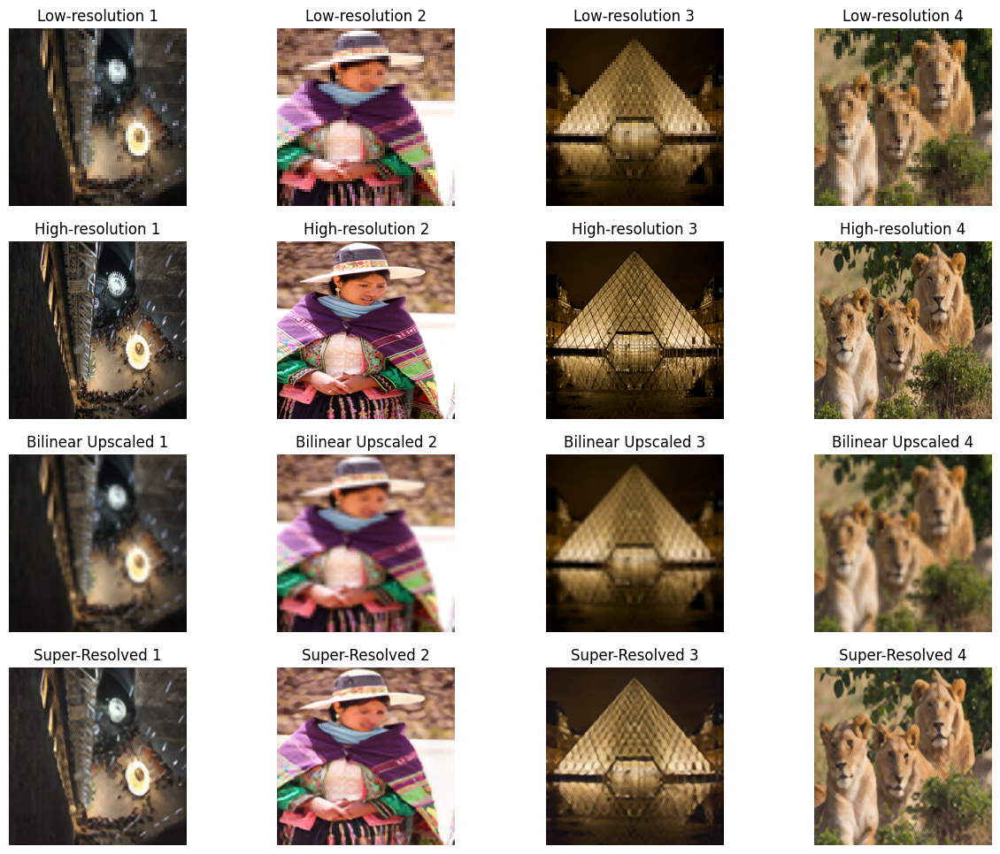

Saved Improved Model
Epoch 1/100 completed. Best Val Loss: 3.3819


Epoch ::::  2  d_loss ::: 9.354854136899859e-05  g_loss :::3.263979023694992: 100%|██████████| 100/100 [01:01<00:00,  1.62it/s] 
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


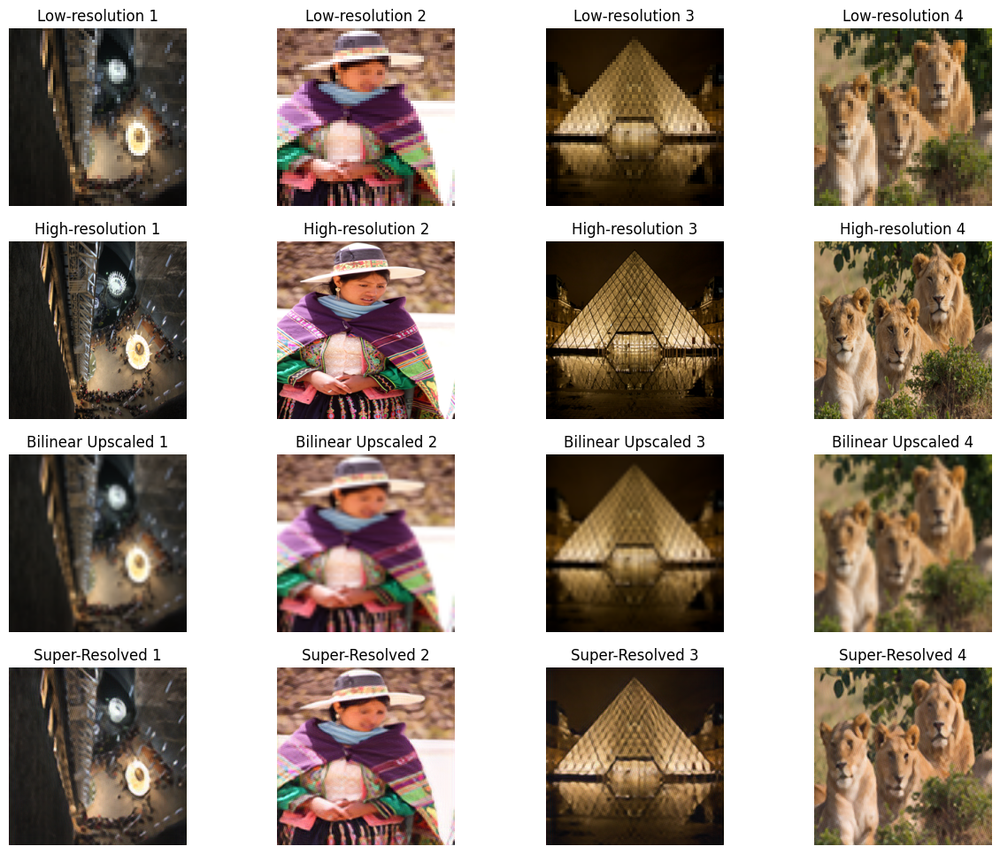

Saved Improved Model
Epoch 2/100 completed. Best Val Loss: 3.2640


Epoch ::::  3  d_loss ::: 7.965931453534081e-05  g_loss :::3.04191153883934: 100%|██████████| 100/100 [01:01<00:00,  1.61it/s]  
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


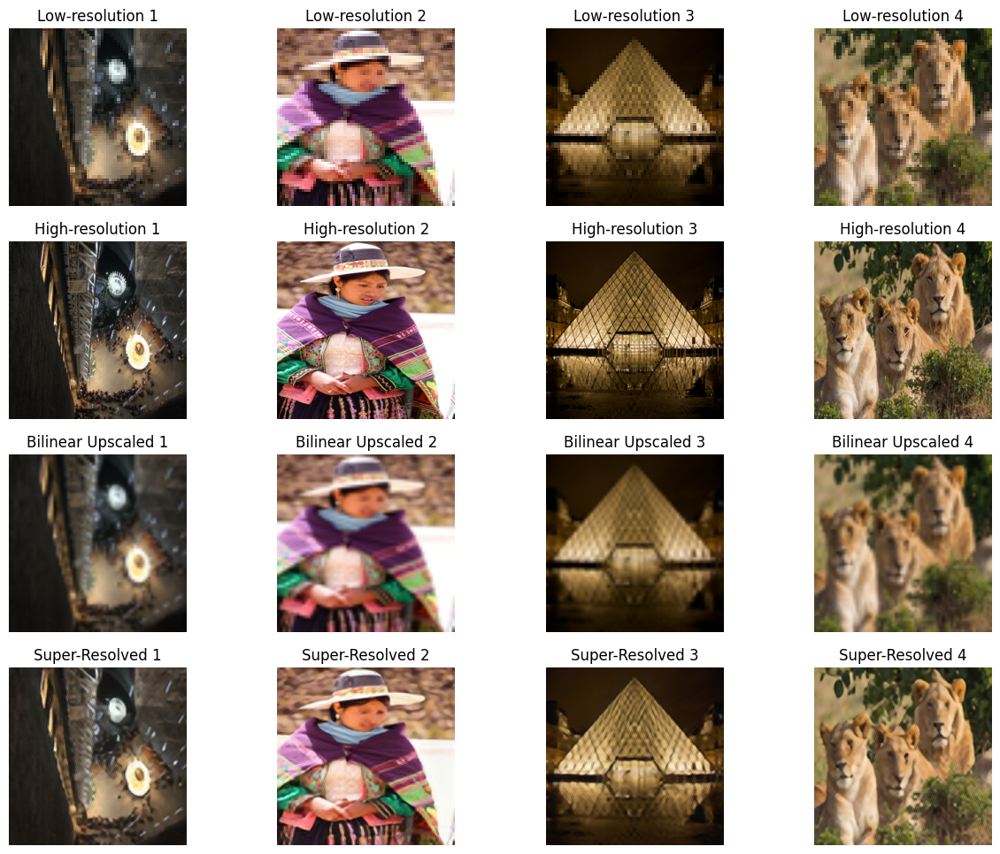

Saved Improved Model
Epoch 3/100 completed. Best Val Loss: 3.0419


Epoch ::::  4  d_loss ::: 7.916149286391061e-06  g_loss :::3.100297533273697: 100%|██████████| 100/100 [01:02<00:00,  1.61it/s] 
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


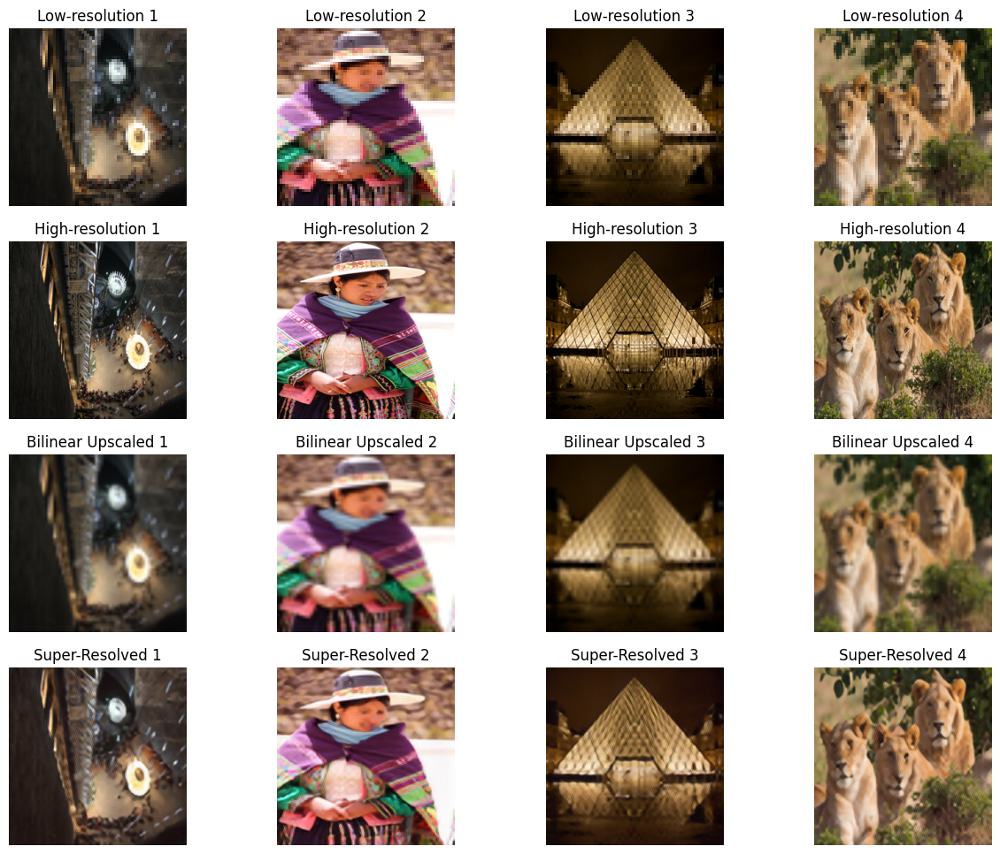

Epoch 4/100 completed. Best Val Loss: 3.0419


Epoch ::::  5  d_loss ::: 8.254316736764628e-06  g_loss :::3.1410122048854827: 100%|██████████| 100/100 [01:01<00:00,  1.62it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


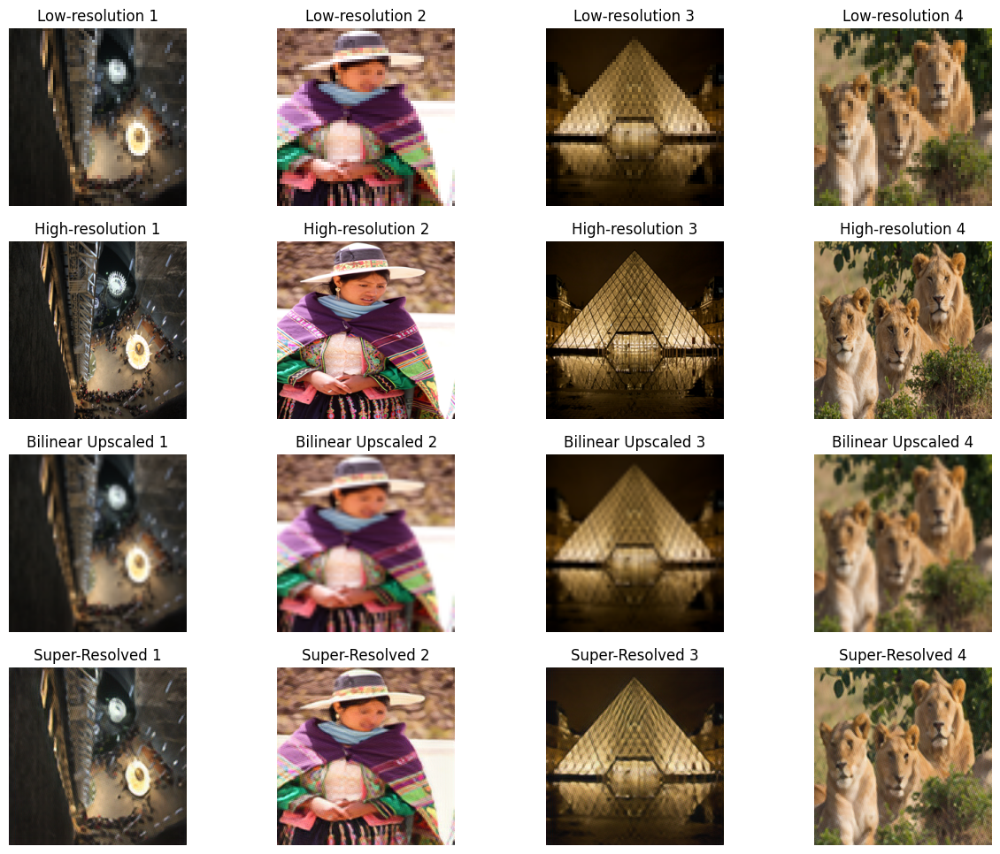

Epoch 5/100 completed. Best Val Loss: 3.0419


Epoch ::::  6  d_loss ::: 7.981735616643254e-06  g_loss :::3.1411101520061493: 100%|██████████| 100/100 [01:01<00:00,  1.61it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


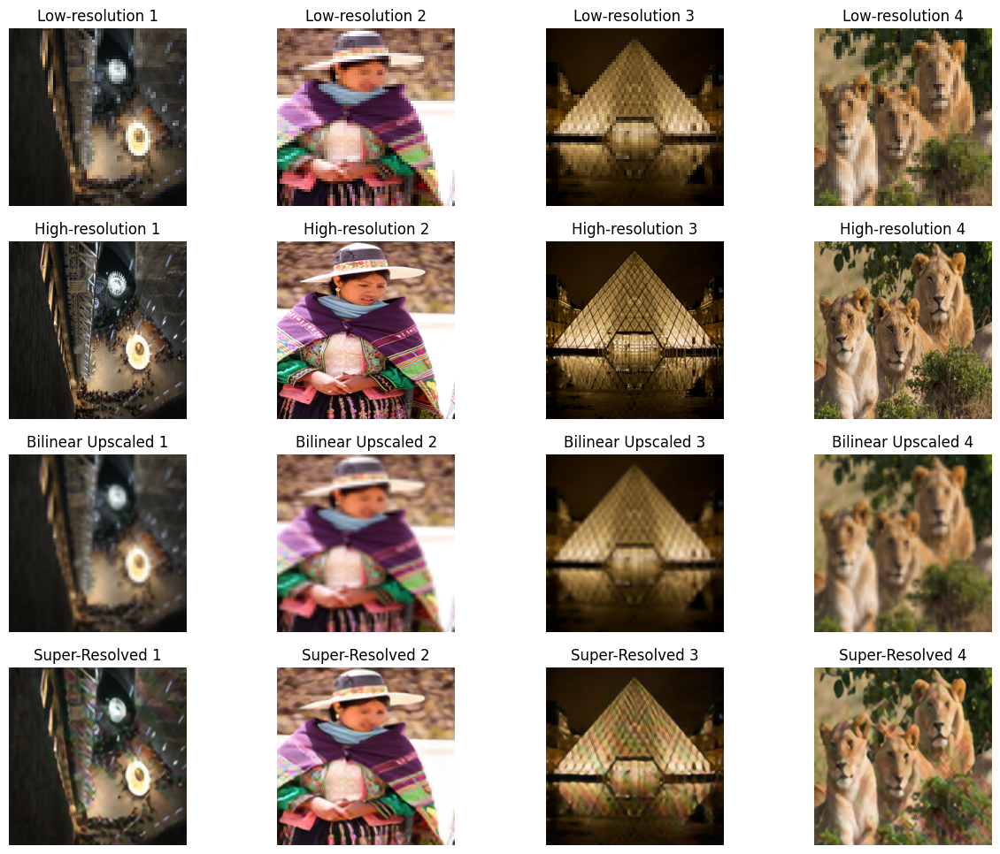

Early stopping triggered


In [30]:
patience = 3
best_val_loss = float('inf')
counter = 0

epochs = 100

for epoch in range(epochs):
    gen.train()
    disc.train()

    train_loss = 0  
    dloss_list=[]
    gloss_list=[]

    progress_bar = tqdm(div2k_data_loader, desc=f"Epoch {epoch + 1}/{epochs}")
    for lr_imgs, hr_imgs in progress_bar:
        looses = Losses(disc_optimizer, gen_optimizer, vgg) 
        disc_loss, gen_loss = looses.calculateLoss(disc, gen, lr_imgs, hr_imgs)
        dloss_list.append(disc_loss.item())
        gloss_list.append(gen_loss.item())
        torch.cuda.empty_cache()

        progress_bar.set_description(
            "Epoch ::::  "+str(epoch+1)+"  d_loss ::: "+str(np.mean(dloss_list))+"  g_loss :::"+str(np.mean(gloss_list))
        )

    # Validation phase
    gen.eval()
    with torch.no_grad():
        div2k_sr_imgs = gen(div2k_data_loader_lr_imgs)
        show_images(div2k_data_loader_lr_imgs, div2k_data_loader_hr_imgs, div2k_sr_imgs, num_images=4)
      
    loss = np.mean(gloss_list)
    # Check for early stopping
    if loss < best_val_loss:
        best_val_loss = loss
        counter = 0
        torch.save(gen.state_dict(), gen_weights_filename)  # Save the best model
        torch.save(disc.state_dict(), disc_weights_filename)  # Save the best model
        print("Saved Improved Model")
    else:
        counter += 1
        if counter >= patience:
            print("Early stopping triggered")
            break

    print(f"Epoch {epoch+1}/{epochs} completed. Best Val Loss: {best_val_loss:.4f}")